In [1]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
image = Image.open('datasets/images/cucdoa1.jpg').convert('RGB')

In [4]:
type(image)

PIL.Image.Image

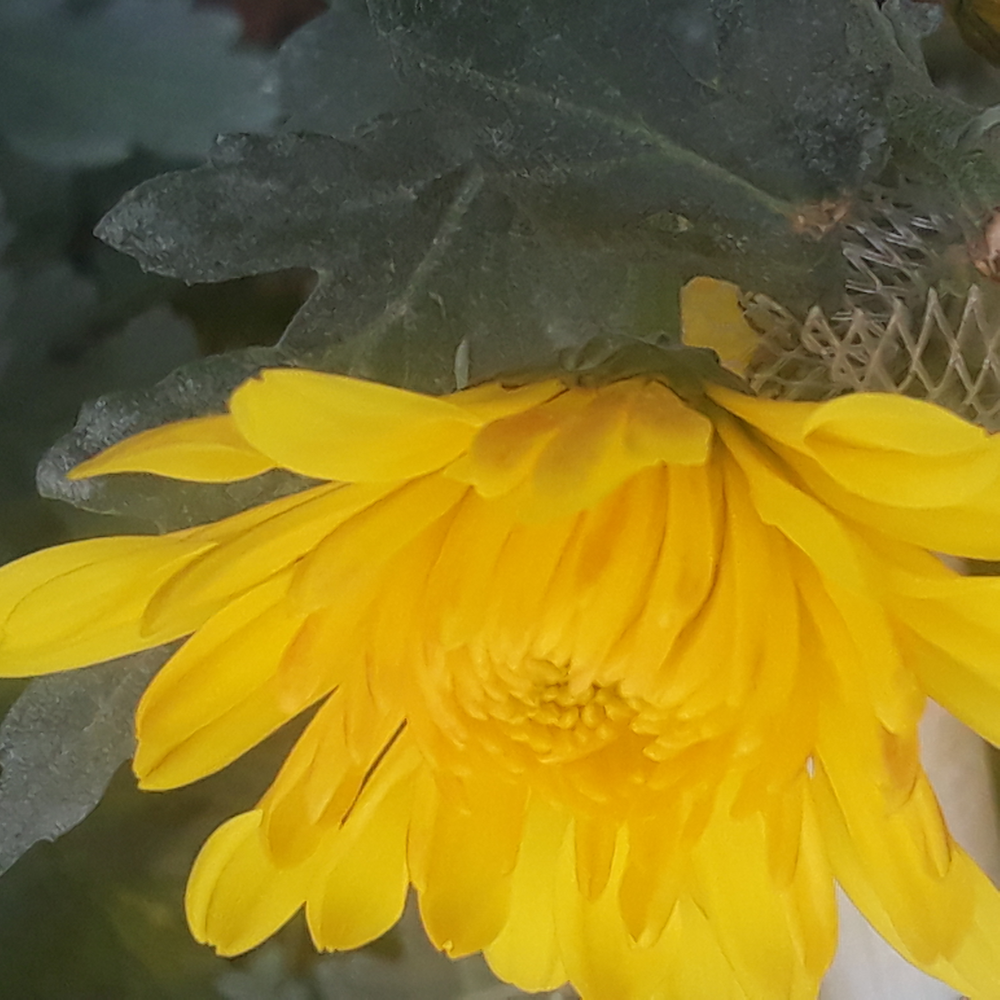

In [5]:
image

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as tf

In [52]:
transforms = tf.Compose([
    tf.Resize(400),
    tf.ToTensor()
])

In [84]:
image_tensor = transforms(image)

In [85]:
image_tensor.shape

torch.Size([3, 400, 400])

In [86]:
image_numpy = np.transpose(image_tensor, (1, 2, 0))

In [87]:
image_numpy.shape

torch.Size([400, 400, 3])

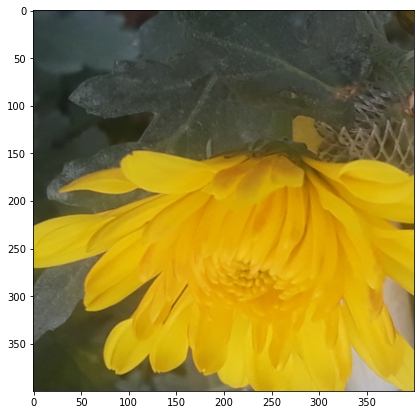

In [88]:
plt.figure(figsize=(7,7))
plt.imshow(image_numpy)
plt.show()

In order to understand the efftects of convolution kernels on our input images to see how it can be used to extract features, we'll use kernels with pre-specified weights which are meant for specific operations such as sharpening, blurring, detecting edges, horizontal and vertical.

In [89]:
sharpen_kernel = [[[[0, -1, 0]],
                   [[-1, 5, -1]],
                   [[0, -1, 0]]]]

In [90]:
horizontal_line_kernel = [[[[1, 0, -1]],
                           [[0, 0, 0]],
                           [[-1, 0, 1]]]]

In [102]:
vertical_line_kernel = [[[[0, 1, 0]],
                         [[1, -4, 1]],
                         [[0, 1, 0]]]]

In [103]:
edge_detection_kernel = [[[[-1, -1, -1]],
                          [[-1, 8, -1]],
                          [[-1, -1, -1]]]]

In [91]:
sharpen_filter = torch.Tensor(sharpen_kernel)

In [92]:
horizontal_line_filter = torch.Tensor(horizontal_line_kernel)

In [93]:
sharpen_filter

tensor([[[[ 0., -1.,  0.]],

         [[-1.,  5., -1.]],

         [[ 0., -1.,  0.]]]])

In [94]:

# #1: 1 channel in feature map
# #2: input image with 3 channels of RGB
# 1,3: shape of filter: 1 row and 3 column

sharpen_filter.shape

torch.Size([1, 3, 1, 3])

In [95]:
# Add batch dimension at axis = 0
# 4-D tensor

image_tensor = image_tensor.unsqueeze(0)
image_tensor.shape

torch.Size([1, 3, 400, 400])

In [96]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

image_tensor = image_tensor.to(device)
sharpen_filter = sharpen_filter.to(device)

In [64]:
feature_map_tensor = F.conv2d(image_tensor, sharpen_filter, padding=0)

In [97]:
feature_map_tensor = F.conv2d(image_tensor, horizontal_line_filter, padding=0)

In [98]:
# The first dimension is batch, there is 1 image in batch
# The second dimension is number of channel, 1 channel, set in sharpen_filter
# Height and width, 0 padding => feature_map smaller than image_tensor

feature_map_tensor.shape

torch.Size([1, 1, 400, 398])

In [99]:
# Get the first image in the batch

feature_map_image = feature_map_tensor[0]
feature_map_image.shape

# Get rid of the first dimension: feature_map_image[0, :, :, :]

torch.Size([1, 400, 398])

In [100]:
# Get rid of the first dimension

feature_map_image = feature_map_image.numpy().squeeze()
feature_map_image.shape

(400, 398)

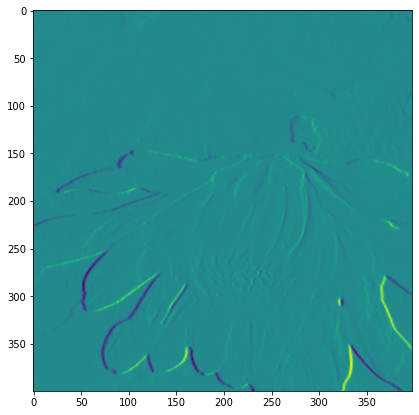

In [101]:
plt.figure(figsize=(7,7))
plt.imshow(feature_map_image)
plt.show()

In [104]:
pool = nn.MaxPool2d(2, 2)

In [105]:
pool_tensor = pool(feature_map_tensor)

In [108]:
# Stride = 2 = size of pool tensor
# The depth of input and number of channel are not effected

pool_tensor.shape

torch.Size([1, 1, 200, 199])

In [109]:
pool_image = pool_tensor[0]
pool_image.shape

torch.Size([1, 200, 199])

In [110]:
pool_image = pool_image.numpy().squeeze()
pool_image.shape

(200, 199)

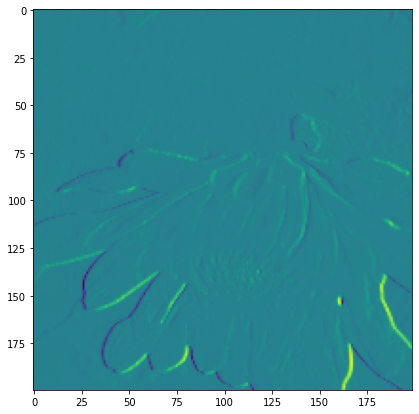

In [111]:
plt.figure(figsize=(7,7))
plt.imshow(pool_image)
plt.show()

# Sharpen Filter

In [112]:
import numpy as np
from PIL import Image 
import matplotlib.pyplot as plt

In [117]:
raw_image = Image.open('datasets/images/cucdoa3.jpg').convert('RGB')

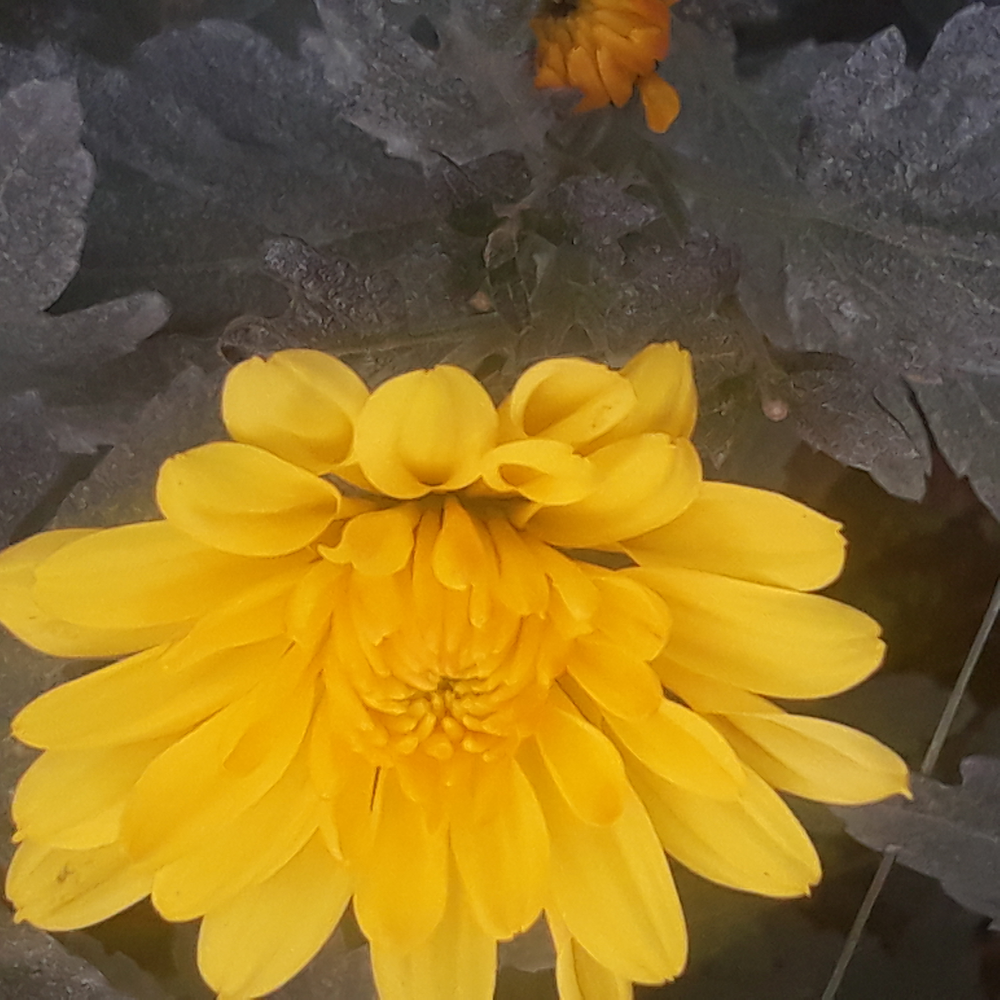

In [118]:
raw_image

In [119]:
import torch 
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as tfs

In [128]:
transforms = tfs.Compose([
    tfs.Resize(400),
    tfs.ToTensor()
])

In [129]:
transform_image = transforms(raw_image)

In [130]:
transform_image.shape

torch.Size([3, 400, 400])

In [131]:
transform_image_numpy = np.transpose(transform_image, (1, 2, 0))
transform_image_numpy.shape, transform_image_numpy.min(), transform_image_numpy.max()

(torch.Size([400, 400, 3]), tensor(0.), tensor(0.9882))

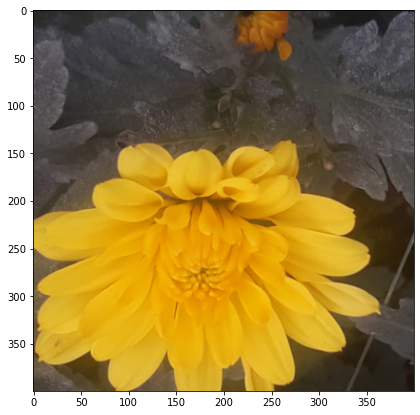

In [133]:
plt.figure(figsize=(7, 7))
plt.imshow(transform_image_numpy)
plt.show()

In [134]:
sharpen_kernel = [[[[0, -1, 0]],
                   [[-1, 5, -1]],
                   [[0, -1, 0]]]]

In [136]:
sharpen_filter = torch.Tensor(sharpen_kernel)
sharpen_filter

tensor([[[[ 0., -1.,  0.]],

         [[-1.,  5., -1.]],

         [[ 0., -1.,  0.]]]])

In [137]:
sharpen_filter.shape

torch.Size([1, 3, 1, 3])

In [138]:
transform_image.shape

torch.Size([3, 400, 400])

In [141]:
input_image = transform_image.unsqueeze(0)
input_image.shape 

torch.Size([1, 3, 400, 400])

In [150]:
feature_map_tensor = F.conv2d(input_image, sharpen_filter, padding=0, stride=1)
feature_map_tensor.shape

torch.Size([1, 1, 400, 398])

In [151]:
feature_map_without_batch_dimension = feature_map_tensor[0, :, :, :]
feature_map_without_batch_dimension.shape

torch.Size([1, 400, 398])

In [152]:
feature_map_image_gray = feature_map_without_batch_dimension.squeeze()
feature_map_image_gray.shape

torch.Size([400, 398])

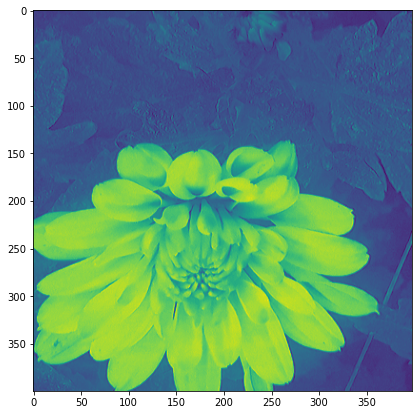

In [153]:
plt.figure(figsize=(7,7))
plt.imshow(feature_map_image_gray)
plt.show()

In [155]:
pool = nn.MaxPool2d(2, 2)
pool_tensor = pool(feature_map_tensor)

In [156]:
pool_tensor.shape

torch.Size([1, 1, 200, 199])

In [157]:
pool_image = pool_tensor[0, :, :, :].squeeze()

In [158]:
pool_image.shape

torch.Size([200, 199])

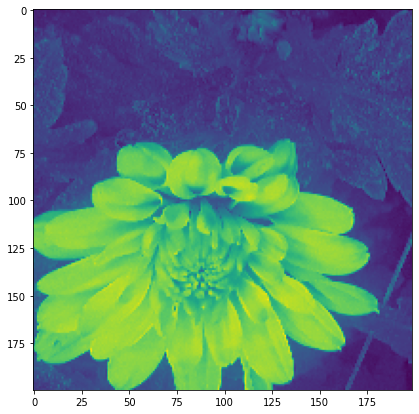

In [159]:
plt.figure(figsize=(7,7))
plt.imshow(pool_image)
plt.show()

# Horizontal Line Filter

In [162]:
import numpy as np 
from PIL import Image
import matplotlib.pyplot as plt

raw_image = Image.open('datasets/images/cucdoa3.jpg').convert('RGB')

In [163]:
import torch 
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as tfs 

In [165]:
transform = tfs.Compose([
    tfs.Resize(400),
    tfs.ToTensor()
])

In [166]:
transform_image = transform(raw_image)

In [167]:
transform_image.shape

torch.Size([3, 400, 400])

In [168]:
transform_image_numpy = np.transpose(transform_image, (1, 2, 0))
transform_image_numpy.shape

torch.Size([400, 400, 3])

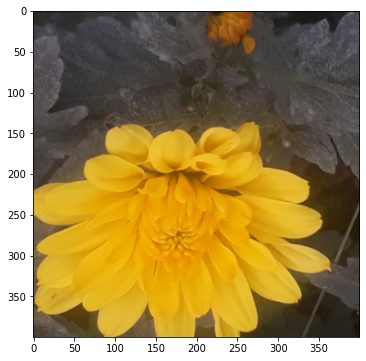

In [169]:
plt.figure(figsize=(6,6))
plt.imshow(transform_image_numpy)
plt.show()

In [170]:
horizontal_line_kernel = [[[[1, 0, -1]],
                           [[0, 0, 0]],
                           [[-1, 0, 1]]]]

In [171]:
horizontal_line_filter = torch.Tensor(horizontal_line_kernel)
horizontal_line_filter.shape

torch.Size([1, 3, 1, 3])

In [172]:
image_tensor = transform_image.unsqueeze(0)
image_tensor.shape

torch.Size([1, 3, 400, 400])

In [173]:
feature_map_tensor = F.conv2d(image_tensor, horizontal_line_filter, padding=0)

In [174]:
feature_map_tensor.shape

torch.Size([1, 1, 400, 398])

In [175]:
feature_map_image = feature_map_tensor[0].squeeze()

In [176]:
feature_map_image.shape

torch.Size([400, 398])

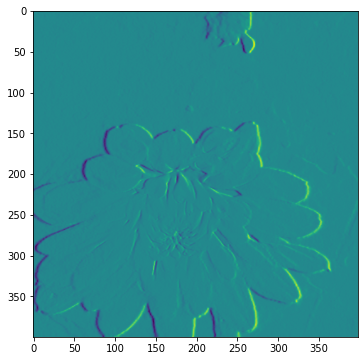

In [178]:
plt.figure(figsize=(6,6))
plt.imshow(feature_map_image)
plt.show()

In [179]:
pool = nn.MaxPool2d(2,2)
pool_tensor = pool(feature_map_tensor)

In [180]:
pool_tensor.shape

torch.Size([1, 1, 200, 199])

In [181]:
pool_image = pool_tensor[0].squeeze()
pool_image.shape 

torch.Size([200, 199])

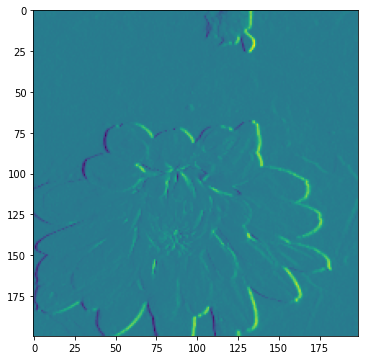

In [182]:
plt.figure(figsize=(6,6))
plt.imshow(pool_image)
plt.show()

# Vertical Line Kernel

In [186]:
import numpy as np 
from PIL import Image 
import matplotlib.pyplot as plt

import torch 
import torch.nn as nn 
import torch.nn.functional as F
import torchvision.transforms as tfs

In [187]:
vertical_line_kernel = [[[[0, 1, 0]],
                         [[1, -4, 1]],
                         [[0, 1, 0]]]]

In [188]:
raw_image = Image.open('datasets/images/cucdoa3.jpg').convert('RGB')

In [189]:
transform = tfs.Compose([
    tfs.Resize(400),
    tfs.ToTensor()
])

In [190]:
image = transform(raw_image)
image.shape

torch.Size([3, 400, 400])

In [191]:
vertical_line_filter = torch.Tensor(vertical_line_kernel)
vertical_line_filter.shape

torch.Size([1, 3, 1, 3])

In [192]:
image = image.unsqueeze(0)
image.shape 

torch.Size([1, 3, 400, 400])

In [193]:
feature_map_tensor = F.conv2d(image, vertical_line_filter, padding=0)
feature_map_tensor.shape 

torch.Size([1, 1, 400, 398])

In [194]:
feature_map_image = feature_map_tensor[0].squeeze()
feature_map_image.shape 

torch.Size([400, 398])

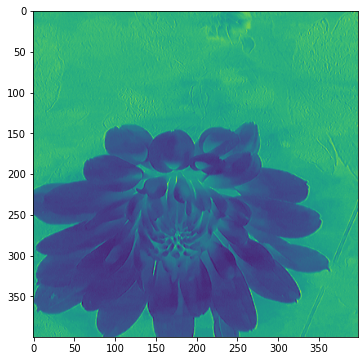

In [195]:
plt.figure(figsize=(6,6))
plt.imshow(feature_map_image)
plt.show()

In [196]:
pool = nn.MaxPool2d(2,2)
pool_tensor = pool(feature_map_tensor)
pool_tensor.shape

torch.Size([1, 1, 200, 199])

In [197]:
pool_image = pool_tensor[0].squeeze()
pool_image.shape 

torch.Size([200, 199])

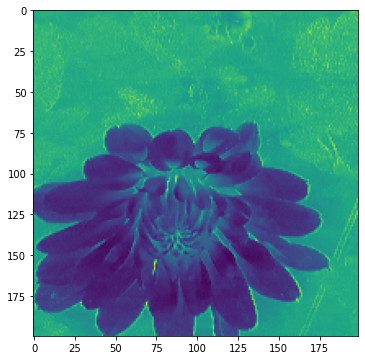

In [198]:
plt.figure(figsize=(6,6))
plt.imshow(pool_image)
plt.show()

# Edge Detect Kernel

In [199]:
import numpy as np 
from PIL import Image 
import matplotlib.pyplot as plt 

import torch 
import torch.nn as nn 
import torch.nn.functional as F 
import torchvision.transforms as tfs 

In [200]:
edge_detection_kernel = [[[[-1, -1, -1]],
                          [[-1, 8, -1]],
                          [[-1, -1, -1]]]]

In [208]:
image = Image.open('datasets/images/cucdoa3.jpg').convert('RGB')

In [209]:
transform = tfs.Compose([
    tfs.Resize(400),
    tfs.ToTensor()
])

In [210]:
image = transform(image)
image.shape 

torch.Size([3, 400, 400])

In [211]:
edge_detection_filter = torch.Tensor(edge_detection_kernel)
edge_detection_filter.shape 

torch.Size([1, 3, 1, 3])

In [212]:
image = image.unsqueeze(0)
image.shape

torch.Size([1, 3, 400, 400])

In [213]:
feature_map_tensor = F.conv2d(image, edge_detection_filter, padding=0)
feature_map_tensor.shape 

torch.Size([1, 1, 400, 398])

In [215]:
feature_map_image = feature_map_tensor[0].squeeze()
feature_map_image.shape 

torch.Size([400, 398])

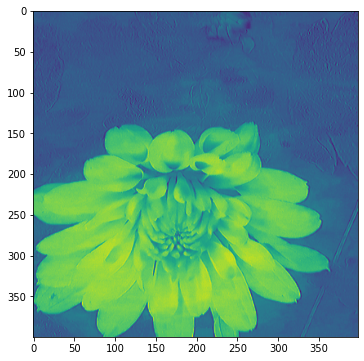

In [216]:
plt.figure(figsize=(6,6))
plt.imshow(feature_map_image)
plt.show()

In [217]:
pool = nn.MaxPool2d(2,2)
pool_tensor = pool(feature_map_tensor)
pool_tensor.shape 

torch.Size([1, 1, 200, 199])

In [218]:
pool_image = pool_tensor[0].squeeze()
pool_image.shape

torch.Size([200, 199])

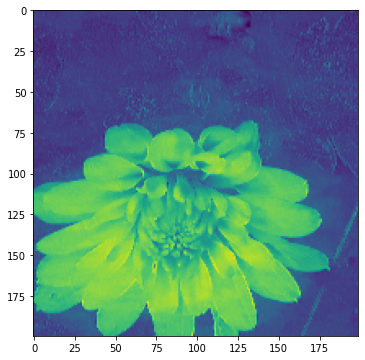

In [219]:
plt.figure(figsize=(6,6))
plt.imshow(pool_image)
plt.show()